In [216]:
import os, sys
import pandas as pd
import math
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter
import importlib.util
import plotly.express as px

# Get current path from where script is executed
if os.name == 'nt':
    sep = '\\'
elif os.name == 'posix':
    sep = '/'
else:
    print(f'What is this OS? {os.name}')

path = os.getcwd()
path_datasets = path[:-len(f'Code{sep}src{sep}project_CSP_MATH_571')] + f'DataSets{sep}weather{sep}'


#MapGenerator Lib
path_maps = path + f'{sep}mapGeneration{sep}mapGeneration.py'
spec = importlib.util.spec_from_file_location("mapGeneration", path_maps)
mp = importlib.util.module_from_spec(spec)
spec.loader.exec_module(mp)


### Load Data 

In [217]:
# Read csv
datasets = os.listdir(path_datasets)

df_list = []
for dataset in datasets:
    if dataset[-4:] == '.csv':
        df = pd.read_csv(path_datasets + dataset, index_col=None, header=0)
        df_list.append(df)


# Merge Taxis Data
df = pd.concat(df_list, axis=0, ignore_index=True)

del(df_list)

df.head()

,station,valid,tmpf,relh,drct,sknt,p01m,skyc1
0,ORD,2017-01-01 00:51,23.00,84.39,250.00,4.00,0.00,CLR
1,ORD,2017-01-01 01:51,21.00,84.62,0.00,0.00,0.00,CLR
2,ORD,2017-01-01 02:51,21.00,87.97,210.00,4.00,0.00,CLR
3,ORD,2017-01-01 03:51,19.00,87.87,190.00,5.00,0.00,CLR
4,ORD,2017-01-01 04:51,21.00,87.97,200.00,4.00,0.00,CLR


### Shape of Dataset

In [218]:
df.shape

(34278, 8)

In [219]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34278 entries, 0 to 34277
Data columns (total 8 columns):
station    34278 non-null object
valid      34278 non-null object
tmpf       34278 non-null object
relh       34278 non-null object
drct       34278 non-null object
sknt       34278 non-null object
p01m       34278 non-null object
skyc1      34278 non-null object
dtypes: object(8)
memory usage: 2.1+ MB


In [220]:
for col in df.columns: 
    print(col) 

station
valid
tmpf
relh
drct
sknt
p01m
skyc1


In [221]:
df.rename(columns={"valid": "datetime","tmpf": "temprature", "relh":"relative_humidity","drct": "wind_direction","sknt":"Wind Speed",
                "p01m":"precipitation","skyc1":"Sky_Level"},inplace=True)

In [222]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34278 entries, 0 to 34277
Data columns (total 8 columns):
station              34278 non-null object
datetime             34278 non-null object
temprature           34278 non-null object
relative_humidity    34278 non-null object
wind_direction       34278 non-null object
Wind Speed           34278 non-null object
precipitation        34278 non-null object
Sky_Level            34278 non-null object
dtypes: object(8)
memory usage: 2.1+ MB


### Convert into datetime format

In [223]:
for col in df.columns: 
    print(col) 

station
datetime
temprature
relative_humidity
wind_direction
Wind Speed
precipitation
Sky_Level


In [224]:
df['datetime'] =  pd.to_datetime(df['datetime'])

In [225]:
df

,station,datetime,temprature,relative_humidity,wind_direction,Wind Speed,precipitation,Sky_Level
0,ORD,2017-01-01 00:51:00,23.00,84.39,250.00,4.00,0.00,CLR
1,ORD,2017-01-01 01:51:00,21.00,84.62,0.00,0.00,0.00,CLR
2,ORD,2017-01-01 02:51:00,21.00,87.97,210.00,4.00,0.00,CLR
3,ORD,2017-01-01 03:51:00,19.00,87.87,190.00,5.00,0.00,CLR
4,ORD,2017-01-01 04:51:00,21.00,87.97,200.00,4.00,0.00,CLR
...,...,...,...,...,...,...,...,...
34273,ORD,2019-12-30 21:51:00,27.00,88.65,230.00,19.00,T,SCT
34274,ORD,2019-12-30 22:23:00,27.00,84.66,240.00,14.00,T,SCT
34275,ORD,2019-12-30 22:33:00,27.00,84.66,240.00,19.00,T,SCT
34276,ORD,2019-12-30 22:51:00,27.00,80.83,240.00,20.00,T,BKN


### Count of missing value

In [226]:
print(len(df[df['temprature'] == 'M']),len(df[df['relative_humidity'] == 'M']),
len(df[df['wind_direction'] == 'M']),len(df[df['Wind Speed'] == 'M']),
len(df[df['precipitation'] == 'M']),len(df[df['Sky_Level'] == 'M']))


1703 1802 393 66 1496 27


### Plot the missing value

In [227]:
def plotmissing(x):
    # Randomly group by start timestamp
    df.index = df['datetime']
    # Total elements
    timeStart_grouped = df.groupby(pd.Grouper(freq='M'))
    # Total NA elements
    timeStart_tollNA_grouped = df.loc[x].groupby(pd.Grouper(freq='M'))

    # Percentaje
    y = 100 * timeStart_tollNA_grouped.size()/timeStart_grouped.size()
    #y = y[~y.isna()]

    # Plot
    plt.figure(figsize=(10,5))
    plt.fill_between(y.index, y, color='blue', alpha=0.5)
    plt.plot(y, color='red')
    plt.grid()
    plt.xticks(rotation=25, ha='right')
    plt.xlabel('Date')
    plt.ylabel('% of missing NA ')

    plt.show()

### Missing % of NA in temprature col

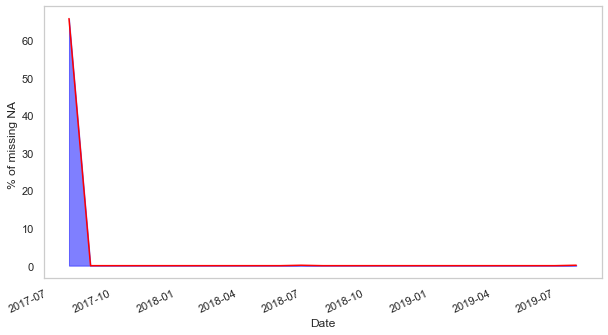

In [230]:
plotmissing(df['temprature'] == 'M')

### Plot temprature

In [231]:
fig = px.line(df, x='datetime', y='temprature')
fig.show()

### Fill the missing value with last known value

In [232]:
def fill(x):
    l=len(x)
    for i in range(l):
        if(x.iloc[i]!='M'):
            t=x.iloc[i]
        else:
            x.iloc[i]=t


In [233]:
fill(df['temprature'])

C:\Users\Iconsense\Anaconda3\envs\abhishek\lib\site-packages\pandas\core\indexing.py:205: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



### All the missing value in temprature

In [234]:
# df.loc[df['temprature'] == 'M']

In [235]:
# fig = px.line(df, x='datetime', y='temprature')
# fig.show()

### Plotting missing value of relative humidity

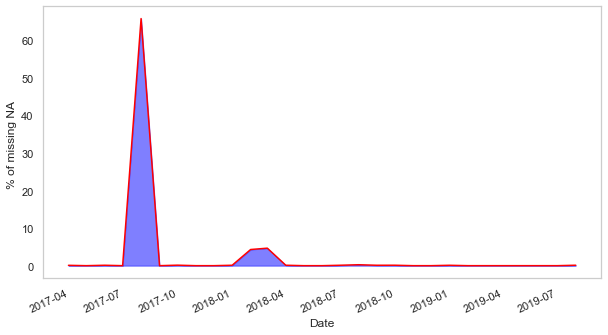

In [236]:
plotmissing(df['relative_humidity']=='M')

In [237]:
#df.loc[df['relative_humidity'] == 'M']

### Plotting relative humidity

In [238]:
fig = px.line(df, x='datetime', y='relative_humidity')
fig.show()

### Fill missing value of relative humidity

In [239]:
fill(df['relative_humidity'])

C:\Users\Iconsense\Anaconda3\envs\abhishek\lib\site-packages\pandas\core\indexing.py:205: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [240]:
#df.loc[df['relative_humidity'] == 'M']

### Plot missing value of wind direction

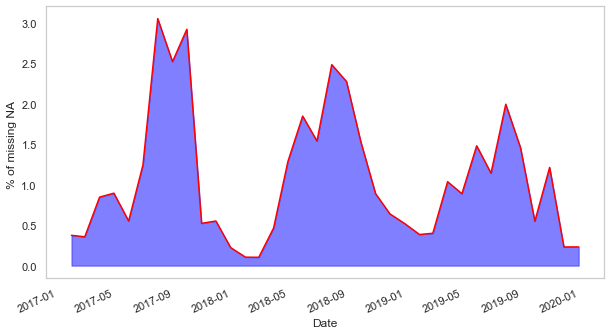

In [241]:
plotmissing(df['wind_direction']=='M')

### Fill missing value of wind direction

In [242]:
fill(df['wind_direction'])

C:\Users\Iconsense\Anaconda3\envs\abhishek\lib\site-packages\pandas\core\indexing.py:205: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [243]:
#df.loc[df['wind_direction'] == 'M']

In [244]:
fig = px.line(df, x='datetime', y='wind_direction')
fig.show()

### Plot missing value of Wind Speed

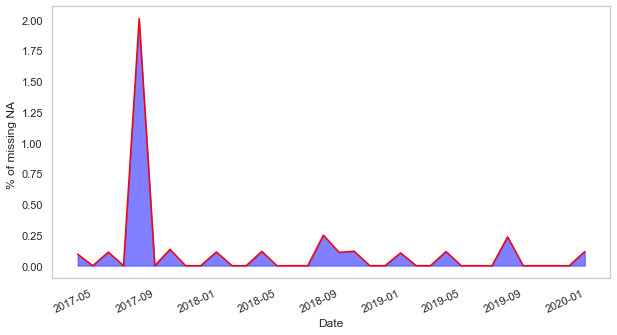

In [245]:
plotmissing(df['Wind Speed']=='M')

### Plot Wind direction 

In [246]:
fig = px.line(df, x='datetime', y='Wind Speed')
fig.show()

### Fill missing value

In [247]:
fill(df['Wind Speed'])

C:\Users\Iconsense\Anaconda3\envs\abhishek\lib\site-packages\pandas\core\indexing.py:205: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



### Plot wind speed after filling missing value

In [248]:
# fig = px.line(df, x='datetime', y='Wind Speed')
# fig.show()

In [249]:
#df.loc[df['Wind Speed'] == 'M']

### Plot missing value of precipitation

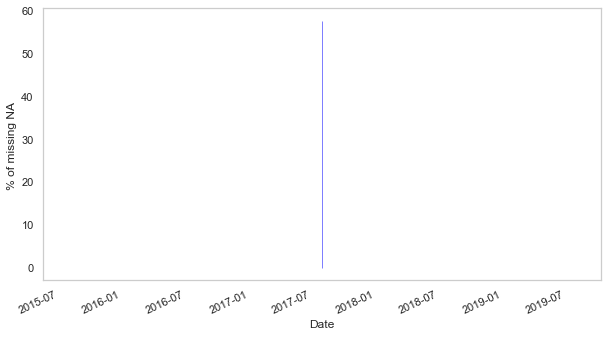

In [250]:
plotmissing(df['precipitation']=='M')

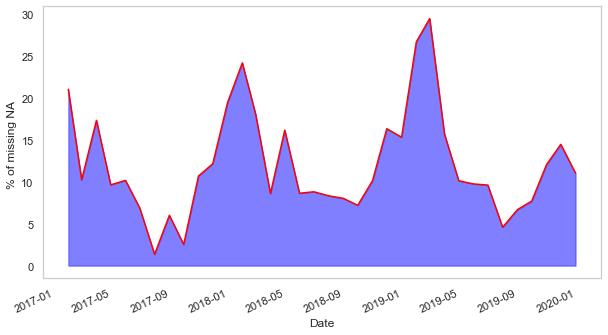

In [251]:
plotmissing(df['precipitation']=="T")

In [252]:
#df.loc[df['precipitation']=="T"]

### Plot the precipitation

In [253]:
# fig = px.line(df, x='datetime', y='precipitation')
# fig.show()

### Fill the missing value

In [254]:
fill(df['precipitation'])

C:\Users\Iconsense\Anaconda3\envs\abhishek\lib\site-packages\pandas\core\indexing.py:205: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [255]:
l=len(df['precipitation'])
for i in range(l):
    if(df['precipitation'].iloc[i]!='T'):
        t=df['precipitation'].iloc[i]
    else:
        df['precipitation'].iloc[i]=t

In [256]:
# fig = px.line(df, x='datetime', y='precipitation')
# fig.show()

### missing value in sky level

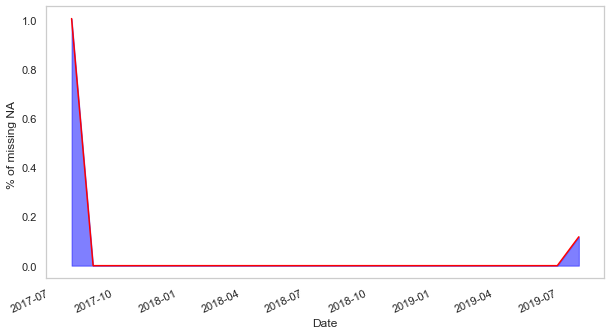

In [257]:
plotmissing(df['Sky_Level']=='M')

In [258]:

# ASOS Measured Human ASOS
# Amount in % Equivalent Report
# of sky cover in oktas
# 00 to < 05 0 CLR
# > 05 to < 25 > 0 to 2/8 FEW
# > 25 to < 50 > 2/8 to < 4/8 SCT
# > 50 to < 87 > 4/8 to < 8/8 BKN
# > 87 to 100 8/8 OVC

### Plot sky value

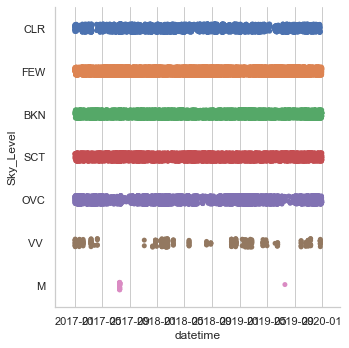

In [259]:
sns.catplot(x="datetime", y="Sky_Level", data=df)

In [260]:
#df.loc[df['Sky_Level'] == 'M'].head()

### Fill Missing value

In [261]:
fill(df['Sky_Level'])

C:\Users\Iconsense\Anaconda3\envs\abhishek\lib\site-packages\pandas\core\indexing.py:205: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



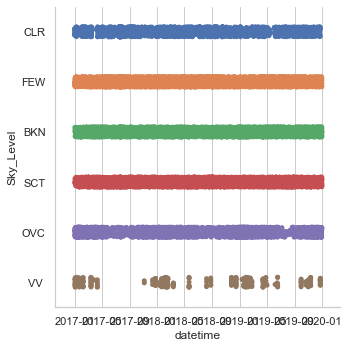

In [262]:
sns.catplot(x="datetime", y="Sky_Level", data=df)

In [263]:
df

,station,datetime,temprature,relative_humidity,wind_direction,Wind Speed,precipitation,Sky_Level
datetime,,,,,,,,
2017-01-01 00:51:00,ORD,2017-01-01 00:51:00,23.00,84.39,250.00,4.00,0.00,CLR
2017-01-01 01:51:00,ORD,2017-01-01 01:51:00,21.00,84.62,0.00,0.00,0.00,CLR
2017-01-01 02:51:00,ORD,2017-01-01 02:51:00,21.00,87.97,210.00,4.00,0.00,CLR
2017-01-01 03:51:00,ORD,2017-01-01 03:51:00,19.00,87.87,190.00,5.00,0.00,CLR
2017-01-01 04:51:00,ORD,2017-01-01 04:51:00,21.00,87.97,200.00,4.00,0.00,CLR
...,...,...,...,...,...,...,...,...
2019-12-30 21:51:00,ORD,2019-12-30 21:51:00,27.00,88.65,230.00,19.00,0.25,SCT
2019-12-30 22:23:00,ORD,2019-12-30 22:23:00,27.00,84.66,240.00,14.00,0.25,SCT
2019-12-30 22:33:00,ORD,2019-12-30 22:33:00,27.00,84.66,240.00,19.00,0.25,SCT


In [270]:
df['temprature'] = pd.to_numeric(df['temprature'])
df['relative_humidity'] = pd.to_numeric(df['relative_humidity'])
df['wind_direction'] = pd.to_numeric(df['wind_direction'])
df['Wind Speed'] = pd.to_numeric(df['Wind Speed'])
df['precipitation'] = pd.to_numeric(df['precipitation'])




In [271]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 34278 entries, 2017-01-01 00:51:00 to 2019-12-30 23:51:00
Data columns (total 8 columns):
station              34278 non-null object
datetime             34278 non-null datetime64[ns]
temprature           34278 non-null float64
relative_humidity    34278 non-null float64
wind_direction       34278 non-null float64
Wind Speed           34278 non-null float64
precipitation        34278 non-null float64
Sky_Level            34278 non-null object
dtypes: datetime64[ns](1), float64(5), object(2)
memory usage: 3.6+ MB


In [272]:
import warnings
warnings.simplefilter(action = "ignore", category = RuntimeWarning)

### Boxplot of all the features

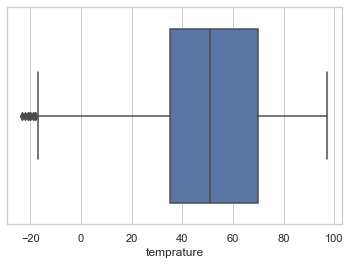

In [273]:
import seaborn as sns
sns.set(style="whitegrid")

ax = sns.boxplot(x=df['temprature'])

In [287]:
df['temprature'].sort_values()

datetime
2019-01-30 06:51:00   -23.1
2019-01-30 07:51:00   -23.1
2019-01-30 05:51:00   -22.0
2019-01-30 08:51:00   -22.0
2019-01-31 05:51:00   -20.9
                       ... 
2018-08-04 12:51:00    95.0
2018-06-29 16:51:00    95.0
2018-05-27 14:51:00    95.0
2018-08-04 13:51:00    96.1
2018-05-27 15:51:00    97.0
Name: temprature, Length: 34278, dtype: float64

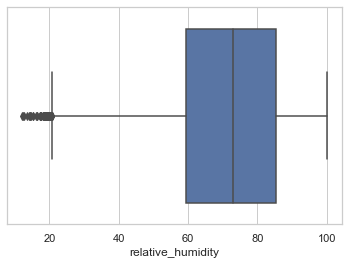

In [274]:
import seaborn as sns
sns.set(style="whitegrid")

ax = sns.boxplot(x=df['relative_humidity'])

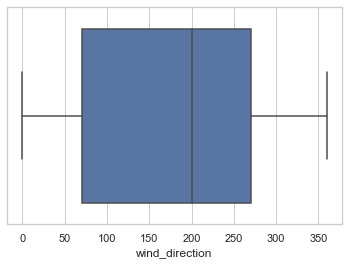

In [276]:
import seaborn as sns
sns.set(style="whitegrid")

ax = sns.boxplot(x=df['wind_direction'])

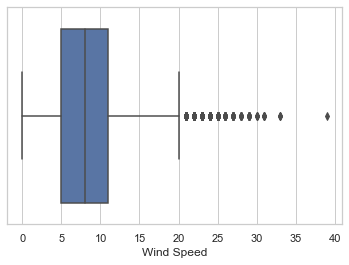

In [277]:
import seaborn as sns
sns.set(style="whitegrid")

ax = sns.boxplot(x=df['Wind Speed'])

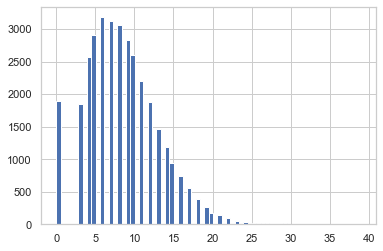

In [282]:
hist = df['Wind Speed'].hist(bins=70)   

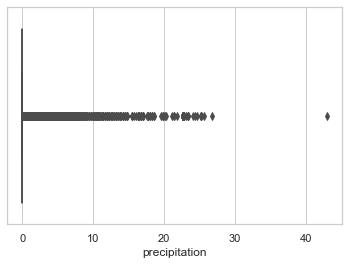

In [278]:
import seaborn as sns
sns.set(style="whitegrid")

ax = sns.boxplot(x=df['precipitation'])

In [289]:
df['precipitation'].sort_values(ascending=False)

datetime
2018-08-07 15:51:00    42.93
2019-10-02 23:51:00    26.67
2018-08-07 15:43:00    25.65
2019-05-27 15:51:00    25.15
2019-05-27 15:02:00    25.15
                       ...  
2018-11-02 21:51:00     0.00
2018-11-02 22:51:00     0.00
2018-11-02 23:51:00     0.00
2018-11-03 00:51:00     0.00
2017-01-01 00:51:00     0.00
Name: precipitation, Length: 34278, dtype: float64

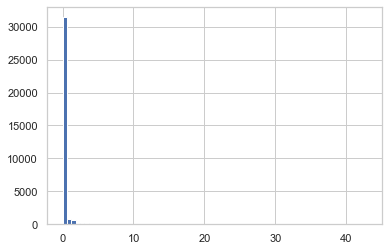

In [281]:
hist = df['precipitation'].hist(bins=70)      

# After studing all the boxplot and histogram and found the outlier to be the real case not error values therefore did not remove them